<a href="https://colab.research.google.com/github/13Shailja/_2DObjectDetection/blob/main/2D_Object_Detection_Yolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2D Object detection using YOLOv5

In [1]:
# Cloning the repo of yolov5 to fulfill the requirements
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

Cloning into 'yolov5'...
remote: Enumerating objects: 12411, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 12411 (delta 3), reused 1 (delta 1), pack-reused 12400
Receiving objects: 100% (12411/12411), 12.35 MiB | 19.22 MiB/s, done.
Resolving deltas: 100% (8501/8501), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.7 MB/s 


In [2]:
# Importing required libraries

import torch # YOLOv5 implemented using pytorch
from IPython.display import Image # To render the predictions
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.1-353-g2e10909 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.8/166.8 GB disk)


# Setting up our custom dataset

In [3]:
# Unzipping the dataset
!unzip -q ../VehicleDataset.zip -d ../

# Then deleting the zip folder
!rm -rf ../VehicleDataset.zip

# Training the model

In [5]:
!python train.py --img 640 --batch 1 --epochs 1 \
  --data objectDetection.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt \
  --name yolov5_vehicle --cache

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=objectDetection.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1, batch_size=1, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5_vehicle, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-353-g2e10909 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0,

In [6]:
# Training Yolov5 on Vehicle Dataset for 50 epochs

!python train.py --img 640 --batch 16 --epochs 50 \
  --data objectDetection.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt \
  --name yolov5_vehicle --cache

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=objectDetection.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5_vehicle, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-353-g2e10909 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.

# Predicting on Street.mp4

In [7]:
# Predicting
!python detect.py --weights runs/train/yolov5_vehicle2/weights/best.pt --img 640 --conf 0.25 --source ../Street.mp4

detect: weights=['runs/train/yolov5_vehicle2/weights/best.pt'], source=../Street.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-353-g2e10909 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/469) /content/Street.mp4: 384x640 4 Cars, 3 Taxis, Done. (0.020s)
video 1/1 (2/469) /content/Street.mp4: 384x640 4 Cars, 3 Taxis, Done. (0.013s)
video 1/1 (3/469) /content/Street.mp4: 384x640 2 Cars, 4 Taxis, Done. (0.014s)
video 1/1 (4/469) /content/Street.mp4: 384x640 3 Cars, 4 Taxis, Done. (0.015s)
video 1/1 (5/469) /conte

### The result is saved on PredictionsYolov5/Street_Prediction.mp4

# Predicting on TimesSquare.mp4

In [8]:
# Predicting
!python detect.py --weights runs/train/yolov5_vehicle2/weights/best.pt --img 640 --conf 0.25 --source ../TimesSquare.mp4

detect: weights=['runs/train/yolov5_vehicle2/weights/best.pt'], source=../TimesSquare.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-353-g2e10909 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/216) /content/TimesSquare.mp4: 384x640 3 Cars, 10 Taxis, Done. (0.015s)
video 1/1 (2/216) /content/TimesSquare.mp4: 384x640 3 Cars, 10 Taxis, Done. (0.011s)
video 1/1 (3/216) /content/TimesSquare.mp4: 384x640 2 Cars, 11 Taxis, Done. (0.018s)
video 1/1 (4/216) /content/TimesSquare.mp4: 384x640 2 Cars, 11 Taxis, Done. (0.0

### The result is saved on PredictionsYolov5/TimesSquare_Prediction.mp4

## Exploring the training metrics using TensorBoard

In [9]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Checking the confidence level of our model by plotting the validation batch from the training and looking at the confidence score of each class

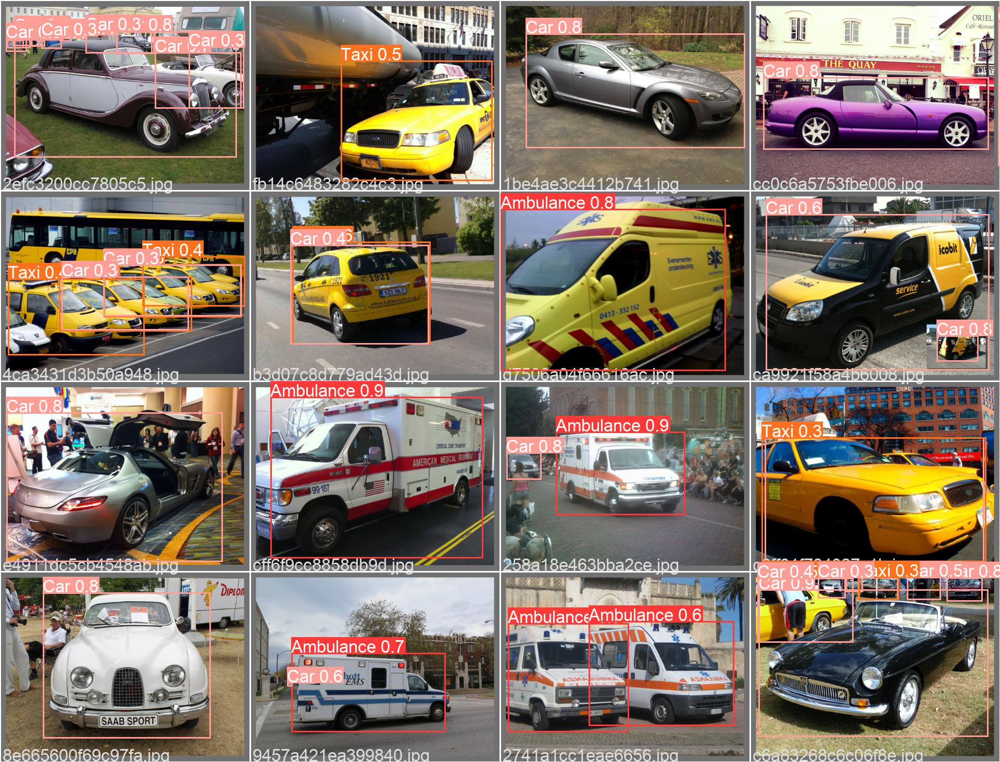

In [14]:
Image(filename='runs/train/yolov5_vehicle2/val_batch2_pred.jpg', width=1000)

In [30]:
!zip -r /content/modelyolov5.zip /content/yolov5/runs/train/yolov5_vehicle2/

  adding: content/yolov5/runs/train/yolov5_vehicle2/ (stored 0%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/val_batch1_pred.jpg (deflated 6%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/val_batch1_labels.jpg (deflated 6%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/R_curve.png (deflated 9%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/opt.yaml (deflated 43%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/labels.jpg (deflated 17%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/train_batch1.jpg (deflated 2%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/hyp.yaml (deflated 45%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/events.out.tfevents.1659441515.371805ede44d.341.0 (deflated 29%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/val_batch2_labels.jpg (deflated 4%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/weights/ (stored 0%)
  adding: content/yolov5/runs/train/yolov5_vehicle2/weights/best.pt (deflated 9%)
  adding: 

# Looking at the metrics

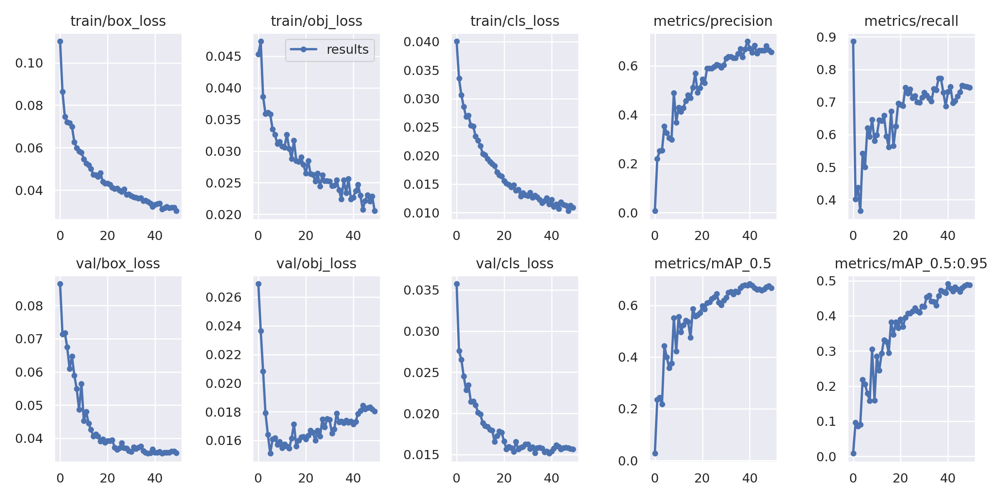

In [31]:
display.Image(f"runs/train/yolov5_vehicle2/results.png")

# Fine tuning the model

In [33]:
!python train.py --hyp 'hyp.scratch-high.yaml' --batch 16 --epochs 100 --data 'objectDetection.yaml' --weights 'runs/train/yolov5_vehicle2/weights/best.pt' --name 'fine-tuning' --cache

train: weights=runs/train/yolov5_vehicle2/weights/best.pt, cfg=, data=objectDetection.yaml, hyp=hyp.scratch-high.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=fine-tuning, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-353-g2e10909 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.0, iou_t=0.2, anchor_t=4.0

# Looking at the evaluation metrics after HyperParameter tuning

The metrics and losses are still improving during the fine tuning stage.

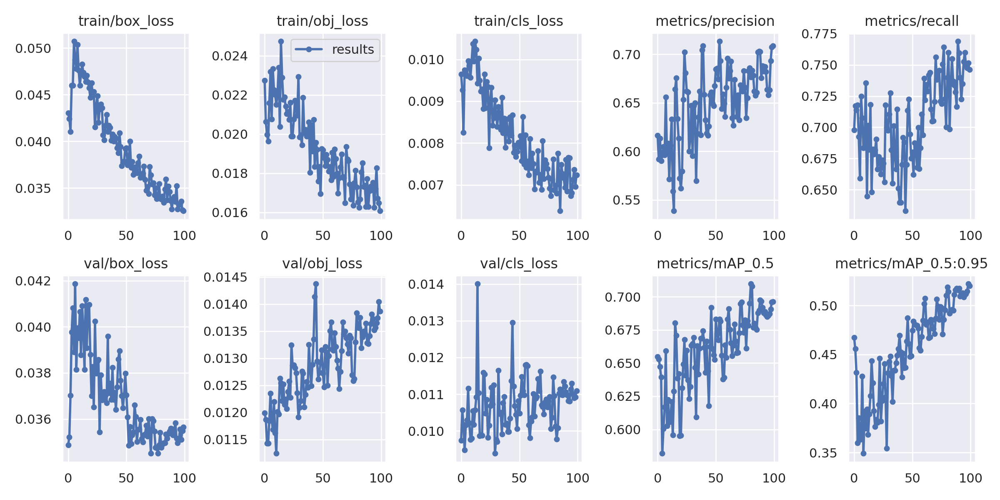

In [34]:
display.Image(f"runs/train/fine-tuning/results.png")

# Using Validation script to evaluate

In [37]:
!python val.py --batch 64 --data 'objectDetection.yaml' --weights 'runs/train/yolov5_vehicle2/weights/best.pt' --name 'Validation' --augment

val: data=/content/yolov5/data/objectDetection.yaml, weights=['runs/train/yolov5_vehicle2/weights/best.pt'], batch_size=64, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=True, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Validation, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-353-g2e10909 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/content/yolov5/../VehicleDataset/labels/val.cache' images and labels... 150 found, 0 missing, 0 empty, 0 corrupt: 100% 150/150 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 3/3 [00:08<00:00,  2.94s/it]
                 all        150        375      0.661      0.774      0.704      0.524
           Ambulance        150         64      0.8

# Looking at the Precision-Recall curve

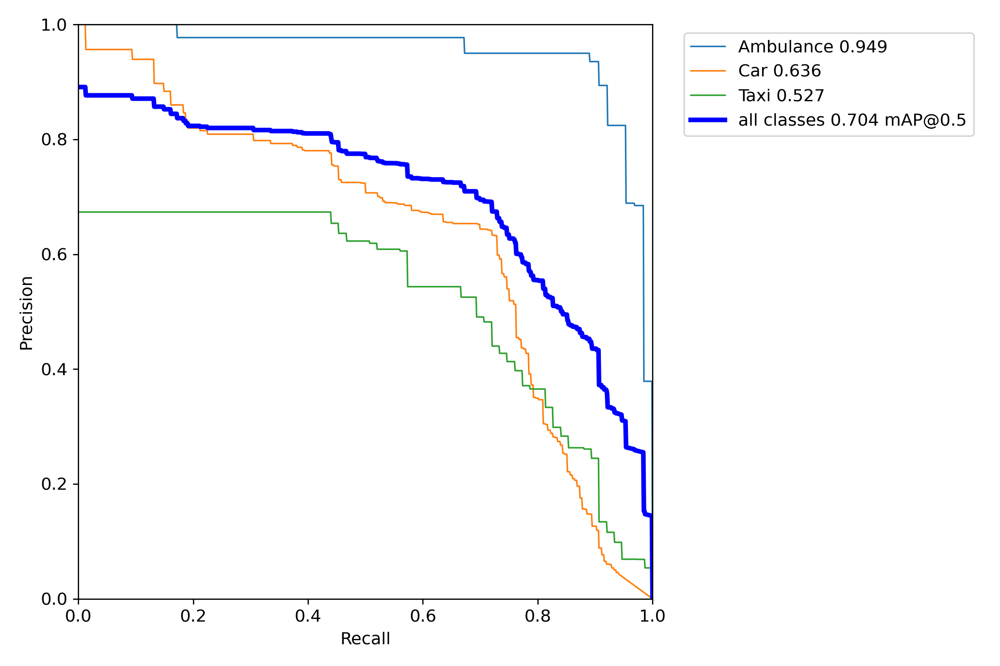

In [40]:
display.Image(f"runs/val/Validation3/PR_curve.png")

# Exporting the model to ONXX and TensorRT format

In [41]:
!python export.py --weights 'runs/train/yolov5_vehicle2/weights/best.pt' --include engine onnx --data 'objectDetection.yaml' --device 0 --imgsz 640 640

export: data=objectDetection.yaml, weights=['runs/train/yolov5_vehicle2/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=0, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['engine', 'onnx']
YOLOv5 🚀 v6.1-353-g2e10909 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/yolov5_vehicle2/weights/best.pt with output shape (1, 25200, 8) (13.8 MB)
requirements: nvidia-tensorrt not found and is required by YOLOv5, attempting auto-update...
Looking in indexes: https://pypi.ngc.nvidia.com, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for nvidia-cublas-cu11: filename=nvidia_cublas_cu11-2022.4.8-py3-none-any.whl 